# Pseudotemporal analysis

## Setting up UMAP

### Load files and packages

In [8]:
import anndata
import scvelo as scv
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sbn
import scipy
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [7, 7]
plt.rcParams['figure.dpi'] = 440

In [2]:
path_to_raw_counts = "/home/gridsan/ssauceda/neuroTF_shared/mouse_cortex_development/umap/reduced_counts_adata.h5ad"
path_to_imputed_counts = "/home/gridsan/ssauceda/neuroTF_shared/mouse_cortex_development/magic/reduced_counts_adata.magic.h5ad"

raw_counts = anndata.read_h5ad(path_to_raw_counts)
imputed_counts = anndata.read_h5ad(path_to_imputed_counts)

#### Functions

In [3]:
def process(adata, highly_variable = [], marker_genes = []):
    '''
    Function following the processing steps of https://doi.org/10.1038/s41586-021-03670-5
    from the section "scRNA-seq pre-processing, initial analysis and clustering" to
    recreate UMAP visualization of atlas
    '''
    ##========== Highly variable genes ==========##
    highly_variable.extend(marker_genes)
    for gene in highly_variable:
        adata.var['highly_variable'][gene] = True
    
    filtered_adata = adata[:, adata.var['highly_variable'] == True]
    
    ##========== Filter cells & genes ==========##
    # Removing genes according to paper
    filtered_genes_list = [
                            name for name in filtered_adata.var_names 
                                   if not name.startswith('mt-')
                                        and not name.startswith('Hb') 
                                        and not name.startswith('Rpl') 
                                        and not name.startswith('Rps')
                                        and not name.startswith('Xist')
                          ]
    # Removing unclustered cells
    filtered_cells_list = [
                            cell for cell in filtered_adata.obs_names 
                                   if filtered_adata.obs['Gral_cellType'][cell] != 'NA' 
                                       and filtered_adata.obs['Gral_cellType'][cell] != 'Null'
                          ]
    
    filtered_adata = filtered_adata[filtered_cells_list, filtered_genes_list]
    
    ##========== Normalization steps ==========##
    print("Normalizing data ... ")
    sc.pp.normalize_total(filtered_adata, target_sum=1e4, exclude_highly_expressed=True)
    sc.pp.log1p(filtered_adata)
    sc.pp.normalize_total(filtered_adata, target_sum=1e4)
    print(30*"-")
    ##========== Regressing out variables ==========##
    print("Regressing out the following variables: ")
    regress_out = ['nCount_RNA', 'nFeature_RNA', 'percent_mito', 'CC_Difference']
    print(*regress_out, sep = "\n")
    sc.pp.regress_out(filtered_adata, regress_out)
    
    return filtered_adata


def calculate_umap(adata, random_state=0):
    '''
    Calculate UMAP according to https://doi.org/10.1038/s41586-021-03670-5
    '''
    print("Calculating PCA for 50 PCs ....")
    sc.tl.pca(adata, n_comps = 50, use_highly_variable=True, random_state=random_state)
    print("Finding nearest neighbors in PCA space ....")
    sc.pp.neighbors(adata, n_neighbors = 15, use_rep='X_pca', n_pcs=50, random_state=random_state)
    print("Calculating UMAP ....")
    sc.tl.umap(adata, random_state=random_state)
    print(30*"-")
    return adata

def plot(adata, category='orig_ident', palette='Spectral', title=""):
    if title == "":
        title = category
        
    fig, ax = plt.subplots()
    sc.pl.umap(
                adata,
                color = category,
                palette = palette,
                ax = ax,
                title = title
                )
    ax.invert_yaxis()
    ax.invert_xaxis()
    ax.axis('equal')

    return fig

plotting_colors = {'Apical progenitors': 'navy',
 'Intermediate progenitors':'steelblue',
 'Red blood cells': 'saddlebrown',
 'VLMC': 'gold',
 'Immature neurons': 'rebeccapurple',
 'Cajal Retzius cells': 'orangered',
 'Microglia': 'pink',
 'Migrating neurons': 'lavender',
 'Endothelial cells': 'lemonchiffon',
 'Pericytes': 'chocolate',
 'Interneurons': 'blue',
 'SCPN': 'green',
 'CThPN': 'darkgreen',
 'DL CPN': 'maroon',
 'UL CPN': 'firebrick',
 'Layer 4': 'darksalmon',
 'Oligodendrocytes': 'mediumvioletred',
 'Layer 6b': 'yellowgreen',
 'NP': 'limegreen',
 'Cycling glial cells': 'lavenderblush',
 'Astrocytes': 'darkmagenta',
 'Ependymocytes': 'blueviolet'}

### Process data

In [ ]:
sc.pp.highly_variable_genes(imputed_counts, flavor='seurat_v3', n_top_genes=3000)

In [5]:
marker_genes = ['Sox2', 'Eomes', 'Nrp1', 'Tubb3', 'Satb2', 'Pdgfra', 'Cux2', 'Bcl11b', 'Tle4', 
                      'Reln', 'Dlx2', 'Apoe', 'Cldn5', 'Aif1', 'Car2', 'Col1a1']

raw_counts = process(raw_counts, highly_variable = [], marker_genes=marker_genes)
imputed_counts = process(imputed_counts, highly_variable = [], marker_genes=marker_genes)

Normalizing data ... 
------------------------------
Regressing out the following variables: 
nCount_RNA
nFeature_RNA
percent_mito
CC_Difference
Normalizing data ... 
------------------------------
Regressing out the following variables: 
nCount_RNA
nFeature_RNA
percent_mito
CC_Difference


In [9]:
raw_counts = calculate_umap(raw_counts, random_state=42)
imputed_counts = calculate_umap(imputed_counts, random_state=42)

Calculating PCA for 50 PCs ....
Finding nearest neighbors in PCA space ....
Calculating UMAP ....
------------------------------
Calculating PCA for 50 PCs ....
Finding nearest neighbors in PCA space ....
Calculating UMAP ....
------------------------------


In [10]:
export_imputed_counts = "/home/gridsan/ssauceda/neuroTF_shared/mouse_cortex_development/scVelo/arlotta.imputed.high_var_only.regress_out.umap.filter_splice.h5ad"
imputed_counts.write_h5ad(export_imputed_counts)

## Plotting UMAPS

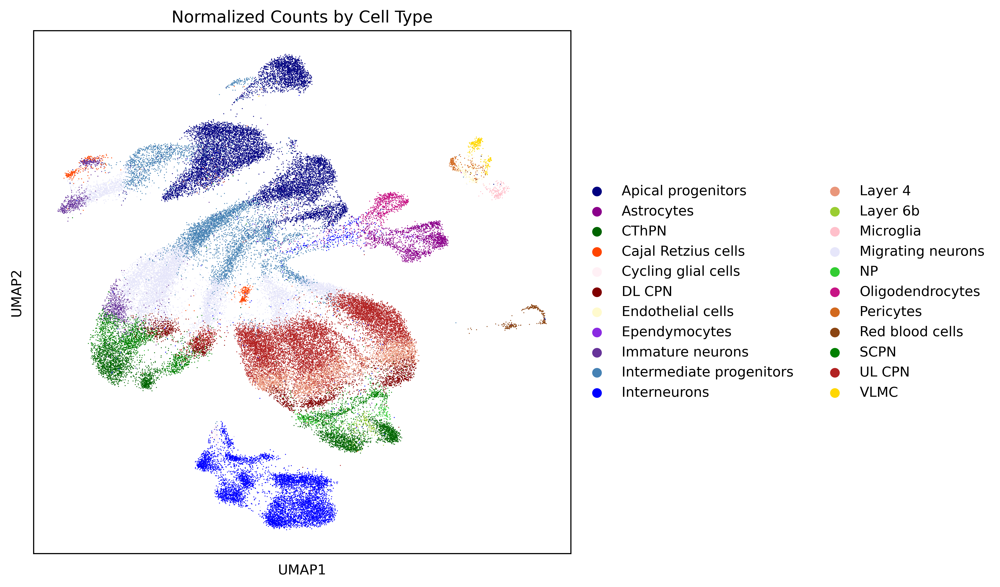

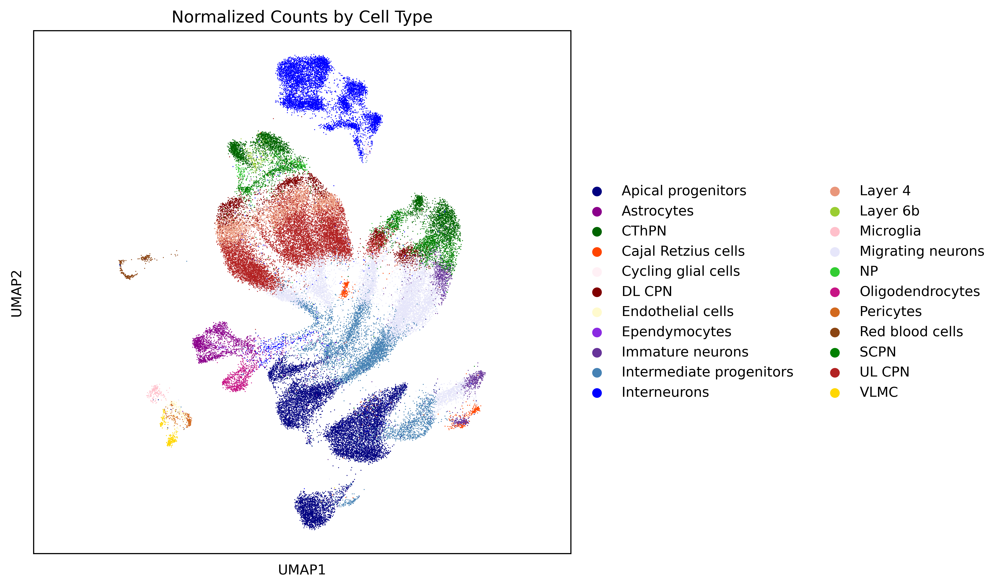

In [42]:
plt.rcParams['figure.figsize'] = [7, 7]
plt.rcParams['figure.dpi'] = 440
plot(umap_raw, category="New_cellType", palette=plotting_colors, title="Normalized Counts by Cell Type")

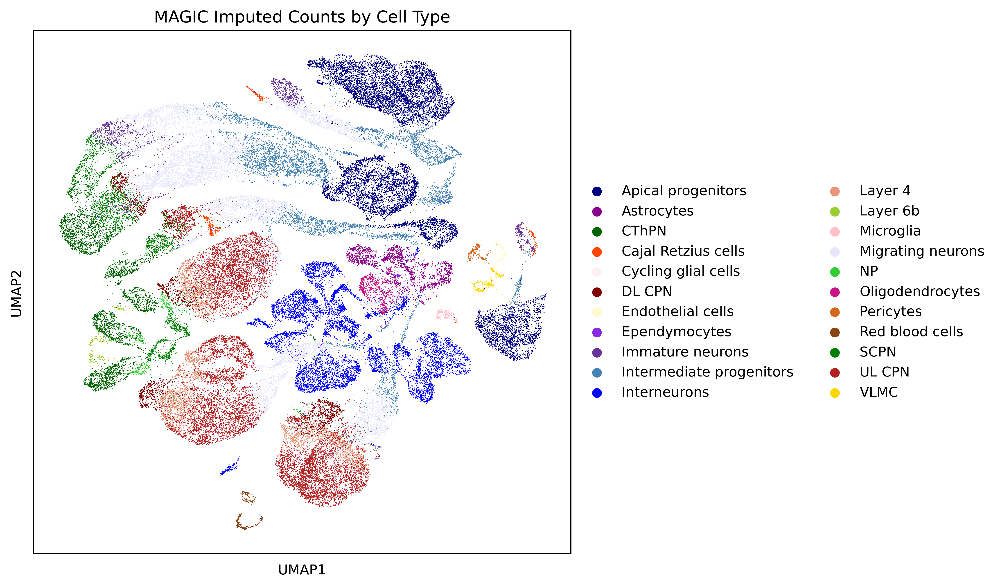

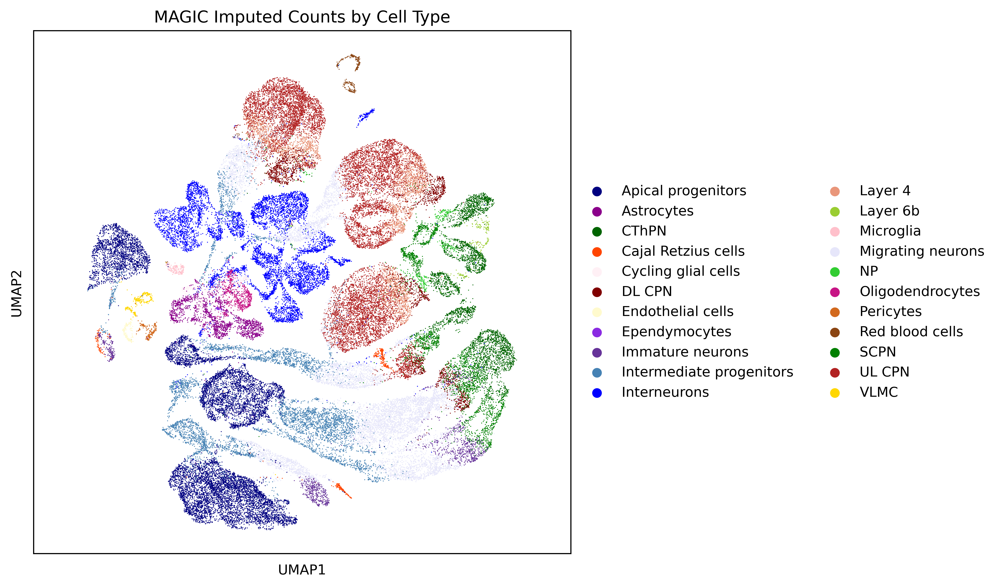

In [43]:
plt.rcParams['figure.figsize'] = [7, 7]
plt.rcParams['figure.dpi'] = 440
plot(imputed_counts, category="New_cellType", palette=plotting_colors, title="MAGIC Imputed Counts by Cell Type")